In [1]:
import tensorflow as tf
from tensorflow.keras.layers import Conv2D, BatchNormalization, Activation, MaxPool2D, Conv2DTranspose, Concatenate, Input
from tensorflow.keras.models import Model
from tensorflow.keras.applications import EfficientNetB0
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt


In [2]:
#ffb0 = EfficientNetB0(include_top=True, weights="imagenet")
#tf.keras.utils.plot_model(model=effb0,show_shapes=True)

###### include_top =True --> then it wants Nonex224x224x3 images else NonexNonexNonex3

###### layers name changes in every reloading

In [3]:
input_shape = (256, 256, 3)
inputs = Input(input_shape)
effb0 = EfficientNetB0(include_top=False, weights="imagenet", input_shape=input_shape)
effb0.summary()

Model: "efficientnetb0"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
rescaling (Rescaling)           (None, 256, 256, 3)  0           input_2[0][0]                    
__________________________________________________________________________________________________
normalization (Normalization)   (None, 256, 256, 3)  7           rescaling[0][0]                  
__________________________________________________________________________________________________
stem_conv_pad (ZeroPadding2D)   (None, 257, 257, 3)  0           normalization[0][0]              
_____________________________________________________________________________________

In [4]:
effb0.layers[0].output

<KerasTensor: shape=(None, 256, 256, 3) dtype=float32 (created by layer 'input_2')>

In [5]:
from tensorflow.keras.layers import Conv2D, BatchNormalization, Activation, MaxPool2D, Conv2DTranspose, Concatenate, Input
from tensorflow.keras.models import Model
from tensorflow.keras.applications import EfficientNetB0
import tensorflow as tf



def conv_block(inputs, num_filters):
    x = Conv2D(num_filters, 3, padding="same")(inputs)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    x = Conv2D(num_filters, 3, padding="same")(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    return x

def decoder_block(inputs, skip, num_filters):
    x = Conv2DTranspose(num_filters, (2, 2), strides=2, padding="same")(inputs)
    x = Concatenate()([x, skip])
    x = conv_block(x, num_filters)
    return x

def build_effienet_unet(input_shape):
    """ Input """
    inputs = Input(input_shape)

    """ Pre-trained Encoder """
    encoder = EfficientNetB0(include_top=False, weights="imagenet", input_tensor=inputs)

    s1 = encoder.layers[0].output                      ## 256 --name of the layers always changes in reloading model soo
    s2 = encoder.get_layer("block2a_expand_activation").output    ## 128
    s3 = encoder.get_layer("block3a_expand_activation").output    ## 64
    s4 = encoder.get_layer("block4a_expand_activation").output    ## 32

    """ Bottleneck """
    b1 = encoder.get_layer("block6a_expand_activation").output    ## 16

    """ Decoder """
    d1 = decoder_block(b1, s4, 512)                               ## 32
    d2 = decoder_block(d1, s3, 256)                               ## 64
    d3 = decoder_block(d2, s2, 128)                               ## 128
    d4 = decoder_block(d3, s1, 64)                                ## 256

    """ Output """
    outputs = Conv2D(3,1,padding="same",activation="softmax")(d4)
    

    model = Model(inputs, outputs, name="EfficientNetB0_UNET")
    return model


##### another approach : specifically out these layers. It is like having branch 

In [6]:
"""base_model = tf.keras.applications.MobileNetV2(input_shape=[128, 128, 3], include_top=False)

# Use the activations of these layers
layer_names = [
    'block_1_expand_relu',   # 64x64
    'block_3_expand_relu',   # 32x32
    'block_6_expand_relu',   # 16x16
    'block_13_expand_relu',  # 8x8
    'block_16_project',      # 4x4
]
base_model_outputs = [base_model.get_layer(name).output for name in layer_names]

# Create the feature extraction model
down_stack = tf.keras.Model(inputs=base_model.input, outputs=base_model_outputs)

down_stack.trainable = False"""

"base_model = tf.keras.applications.MobileNetV2(input_shape=[128, 128, 3], include_top=False)\n\n# Use the activations of these layers\nlayer_names = [\n    'block_1_expand_relu',   # 64x64\n    'block_3_expand_relu',   # 32x32\n    'block_6_expand_relu',   # 16x16\n    'block_13_expand_relu',  # 8x8\n    'block_16_project',      # 4x4\n]\nbase_model_outputs = [base_model.get_layer(name).output for name in layer_names]\n\n# Create the feature extraction model\ndown_stack = tf.keras.Model(inputs=base_model.input, outputs=base_model_outputs)\n\ndown_stack.trainable = False"

In [7]:
dataset, info = tfds.load('oxford_iiit_pet:3.*.*', with_info=True)

In [8]:
dataset

{'test': <PrefetchDataset shapes: {file_name: (), image: (None, None, 3), label: (), segmentation_mask: (None, None, 1), species: ()}, types: {file_name: tf.string, image: tf.uint8, label: tf.int64, segmentation_mask: tf.uint8, species: tf.int64}>,
 'train': <PrefetchDataset shapes: {file_name: (), image: (None, None, 3), label: (), segmentation_mask: (None, None, 1), species: ()}, types: {file_name: tf.string, image: tf.uint8, label: tf.int64, segmentation_mask: tf.uint8, species: tf.int64}>}

In [9]:
for x in dataset['train'].take(1):
  print([i for i in x.keys()])
  print(x['file_name'])
  print(x['image'].shape)
  print(x['segmentation_mask'].shape)
  print(x['species'])
  print(x['label'])

  

['file_name', 'image', 'label', 'segmentation_mask', 'species']
tf.Tensor(b'Sphynx_158.jpg', shape=(), dtype=string)
(500, 500, 3)
(500, 500, 1)
tf.Tensor(0, shape=(), dtype=int64)
tf.Tensor(33, shape=(), dtype=int64)


###### map function only get image and mask, the rest will be ignored

In [10]:
# functional will be used during dataset.map by load_image_train
# it will always work 
def normalize(input_image, input_mask):
  input_image = tf.cast(input_image, tf.float32) / 255.0
  input_mask -= 1
  return input_image, input_mask


# function that will work in map for dataset['train']
#resize image, implements augmentation on probability
#normalize it 
@tf.function
def load_image_train(datapoint):
  input_image = tf.image.resize(datapoint['image'], (128, 128))
  input_mask = tf.image.resize(datapoint['segmentation_mask'], (128, 128))

  if tf.random.uniform(()) > 0.5:
    input_image = tf.image.flip_left_right(input_image)
    input_mask = tf.image.flip_left_right(input_mask)

  input_image, input_mask = normalize(input_image, input_mask)

  return input_image, input_mask

# function that will work in map for dataset['test']
def load_image_test(datapoint):
  input_image = tf.image.resize(datapoint['image'], (128, 128))
  input_mask = tf.image.resize(datapoint['segmentation_mask'], (128, 128))

  input_image, input_mask = normalize(input_image, input_mask)

  return input_image, input_mask


In [11]:
# map datasets
train = dataset['train'].map(load_image_train, num_parallel_calls=tf.data.AUTOTUNE)
test = dataset['test'].map(load_image_test)

TRAIN_LENGTH = info.splits['train'].num_examples
BATCH_SIZE = 64
BUFFER_SIZE = 1000
STEPS_PER_EPOCH = TRAIN_LENGTH // BATCH_SIZE

#last configuration shuffle batch etc.
train_dataset = train.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE).repeat()
train_dataset = train_dataset.prefetch(buffer_size=tf.data.AUTOTUNE)
test_dataset = test.batch(BATCH_SIZE)

In [12]:
def display_single_group(images, labels):
  
  for i in range(len(images)):
    plt.subplot(1,len(images),i+1)  # subplot (1,3,1)  (1,3,2) (1,3,3)
    plt.imshow(tf.keras.preprocessing.image.array_to_img(images[i])) # pil images. .numpy() works problematic as mask is one channel
    plt.title(labels[i])
    plt.axis('off')

plt.show()

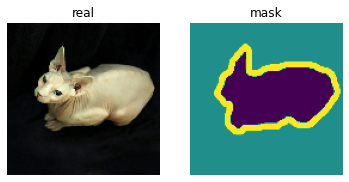

In [13]:
for i in train.take(1): # note train_dataset is batched, this is train not batched
  display_single_group([i[0],i[1]],["real","mask"])

In [14]:
def display_batch(images,masks):
  all_images = [images,masks]
  labels = ['real','mask']
  fig, axs = plt.subplots(nrows=len(images),ncols=2,figsize=(10,640))

  for i in range(len(images)):
    for j in range(2):
      axs[i][j].imshow(tf.keras.preprocessing.image.array_to_img(all_images[j][i]))
      axs[i][j].axis('off')
      axs[i][j].set_title(labels[j])

  
  plt.show()
  

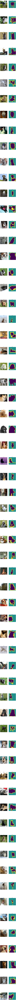

In [15]:
for i in train_dataset.take(1):
  display_batch(i[0],i[1])


In [16]:
model = build_effienet_unet((128,128,3))
model.summary()

Model: "EfficientNetB0_UNET"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 128, 128, 3) 0                                            
__________________________________________________________________________________________________
rescaling_1 (Rescaling)         (None, 128, 128, 3)  0           input_3[0][0]                    
__________________________________________________________________________________________________
normalization_1 (Normalization) (None, 128, 128, 3)  7           rescaling_1[0][0]                
__________________________________________________________________________________________________
stem_conv_pad (ZeroPadding2D)   (None, 129, 129, 3)  0           normalization_1[0][0]            
________________________________________________________________________________

In [ ]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics=['accuracy'])
EPOCHS = 20
VAL_SUBSPLITS = 5
VALIDATION_STEPS = info.splits['test'].num_examples//BATCH_SIZE//VAL_SUBSPLITS

model_history = model.fit(train_dataset, epochs=EPOCHS,
                          steps_per_epoch=STEPS_PER_EPOCH,
                          validation_steps=VALIDATION_STEPS,
                          validation_data=test_dataset)
                          

Epoch 1/20
57/57 [==============================] - 110s 1s/step - loss: 0.4448 - accuracy: 0.8166 - val_loss: 4.8671 - val_accuracy: 0.5691
Epoch 2/20
57/57 [==============================] - 85s 1s/step - loss: 0.2734 - accuracy: 0.8873 - val_loss: 3.0694 - val_accuracy: 0.5690
Epoch 3/20
57/57 [==============================] - 77s 1s/step - loss: 0.2349 - accuracy: 0.9010 - val_loss: 2.5102 - val_accuracy: 0.5690
Epoch 4/20
57/57 [==============================] - 77s 1s/step - loss: 0.2064 - accuracy: 0.9117 - val_loss: 3.5062 - val_accuracy: 0.5690
Epoch 5/20
57/57 [==============================] - 77s 1s/step - loss: 0.1980 - accuracy: 0.9144 - val_loss: 2.8471 - val_accuracy: 0.5698
Epoch 6/20
57/57 [==============================] - 77s 1s/step - loss: 0.1815 - accuracy: 0.9205 - val_loss: 1.5663 - val_accuracy: 0.6524
Epoch 7/20
57/57 [==============================] - 77s 1s/step - loss: 0.1768 - accuracy: 0.9218 - val_loss: 3.1693 - val_accuracy: 0.5692
Epoch 8/20
57/57 [=